In [1]:
%pip install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 592.1 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.2/872.2 kB 17.8 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO

In [3]:
import torch

In [4]:
torch.cuda.is_available()

True

In [5]:
torch.cuda.get_device_name(0)

'Tesla T4'

In [6]:
pip install squarify

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="yyxua7XjcGopqV6Wfg24")
project = rf.workspace("helometv3").project("fix-waste-detection")
version = project.version(2)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.6 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.8
    Uninstalling idna-3.8:
      Successfully uninstalled idna-3.8
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.84, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to FIX-Waste-Detection-2 in yolov8:: 100%|██████████| 8267/8267 [00:03<00:00, 2710.31it/s]


In [12]:
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

In [13]:
sns.set_style('darkgrid')

%matplotlib inline

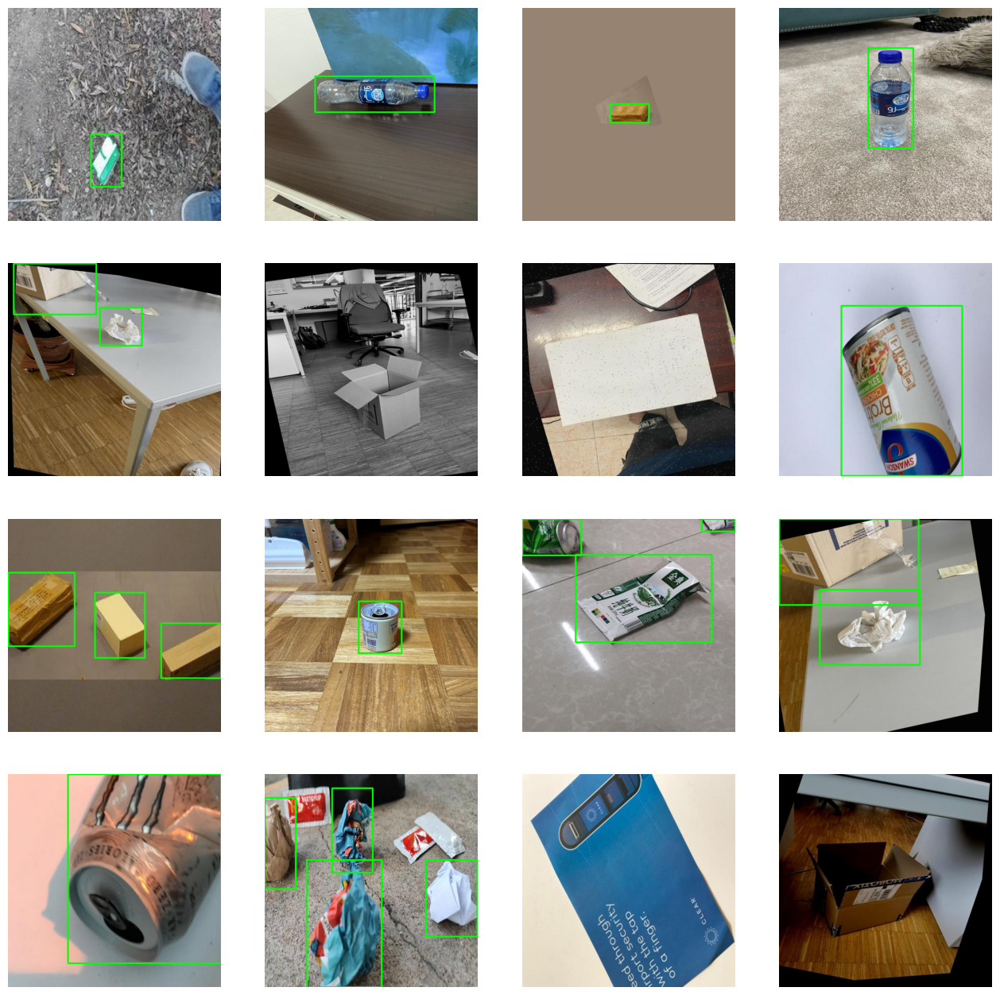

In [14]:
# Define the paths to the images and labels directories
train_images = "FIX-Waste-Detection-2/train/images"
train_labels = "FIX-Waste-Detection-2/train/labels"

test_images = "FIX-Waste-Detection-2/test/images"
test_labels = "FIX-Waste-Detection-2/test/labels"

val_images = "FIX-Waste-Detection-2/valid/images"
val_labels = "FIX-Waste-Detection-2/valid/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [15]:
 # Loading a pretrained model
model = YOLO('yolov8s.pt')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
# Training the model
model.train(data = 'data.yaml',
            epochs = 20,
            imgsz = 640,
            seed = 42,
            batch = 32,
            workers = 4)

engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=data.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=4, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=Fa

train: Scanning /content/FIX-Waste-Detection-2/train/labels.cache... 2871 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2871/2871 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1097, len(boxes) = 3992. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/FIX-Waste-Detection-2/valid/labels.cache... 841 images, 0 backgrounds, 0 corrupt: 100%|██████████| 841/841 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 143, len(boxes) = 1225. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      13.8G     0.9971      2.338      1.357         53        640: 100%|██████████| 90/90 [01:02<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:09<00:00,  1.54it/s]


                   all        841       1225      0.569       0.37      0.365      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      13.8G       1.11      1.436      1.429         60        640: 100%|██████████| 90/90 [00:58<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.61it/s]


                   all        841       1225       0.42      0.311      0.318      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      14.2G      1.115      1.371      1.424         59        640: 100%|██████████| 90/90 [01:03<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:16<00:00,  1.19s/it]


                   all        841       1225      0.241      0.209       0.16      0.089

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      14.1G      1.114       1.35      1.416         74        640: 100%|██████████| 90/90 [01:02<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:09<00:00,  1.52it/s]


                   all        841       1225      0.259      0.312      0.185       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      14.2G      1.074      1.263       1.39         55        640: 100%|██████████| 90/90 [01:09<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:09<00:00,  1.49it/s]


                   all        841       1225        0.6      0.489      0.534      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      13.9G      1.018       1.13      1.353         76        640: 100%|██████████| 90/90 [01:01<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:15<00:00,  1.12s/it]

                   all        841       1225      0.676       0.55      0.613      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      13.9G     0.9824      1.038       1.32         71        640: 100%|██████████| 90/90 [01:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:14<00:00,  1.00s/it]


                   all        841       1225      0.576      0.533      0.535      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      14.2G     0.9558      1.001        1.3         73        640: 100%|██████████| 90/90 [00:59<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]

                   all        841       1225      0.809       0.68      0.756      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      13.8G     0.9121     0.9085      1.266         63        640: 100%|██████████| 90/90 [01:03<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:11<00:00,  1.18it/s]

                   all        841       1225      0.836      0.703      0.792      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      14.2G     0.8922     0.8842      1.256         61        640: 100%|██████████| 90/90 [01:04<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:13<00:00,  1.00it/s]

                   all        841       1225       0.78      0.675      0.768      0.522


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      13.9G      0.857     0.7998      1.288         27        640: 100%|██████████| 90/90 [00:59<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:09<00:00,  1.53it/s]

                   all        841       1225        0.8      0.724      0.812      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      13.9G      0.815     0.7306      1.256         24        640: 100%|██████████| 90/90 [00:57<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:11<00:00,  1.22it/s]

                   all        841       1225      0.757      0.692      0.755       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      14.2G     0.7799     0.6824      1.238         31        640: 100%|██████████| 90/90 [00:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:10<00:00,  1.39it/s]

                   all        841       1225      0.826      0.737       0.83      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      13.9G      0.753      0.626      1.193         27        640: 100%|██████████| 90/90 [00:58<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        841       1225      0.831      0.772      0.836      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      14.2G     0.7272     0.5705      1.175         32        640: 100%|██████████| 90/90 [00:57<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        841       1225       0.86      0.789      0.871       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      13.8G     0.6938      0.535      1.149         27        640: 100%|██████████| 90/90 [00:55<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:09<00:00,  1.41it/s]

                   all        841       1225      0.864      0.836       0.88       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      14.2G     0.6777     0.5041      1.141         28        640: 100%|██████████| 90/90 [00:54<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.64it/s]

                   all        841       1225       0.84      0.818      0.873      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      14.2G     0.6479     0.4589      1.113         31        640: 100%|██████████| 90/90 [00:55<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]

                   all        841       1225      0.865      0.846      0.899       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      14.2G      0.624     0.4361      1.106         33        640: 100%|██████████| 90/90 [00:56<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:07<00:00,  1.85it/s]

                   all        841       1225      0.884      0.848      0.908      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      14.2G     0.5919     0.4042      1.075         24        640: 100%|██████████| 90/90 [01:03<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:07<00:00,  1.76it/s]

                   all        841       1225      0.884      0.858      0.903      0.687



20 epochs completed in 0.409 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 22.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:22<00:00,  1.58s/it]


                   all        841       1225      0.885      0.847      0.908      0.693
         Botol_Plastik        375        399       0.87       0.83      0.897      0.769
                Kaleng        254        447      0.878      0.821      0.912      0.732
                Kardus        215        299      0.886      0.863      0.903      0.747
                Kertas         53         80      0.906      0.875       0.92      0.525
Speed: 0.3ms preprocess, 4.7ms inference, 0.0ms loss, 7.4ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79435cf64340>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

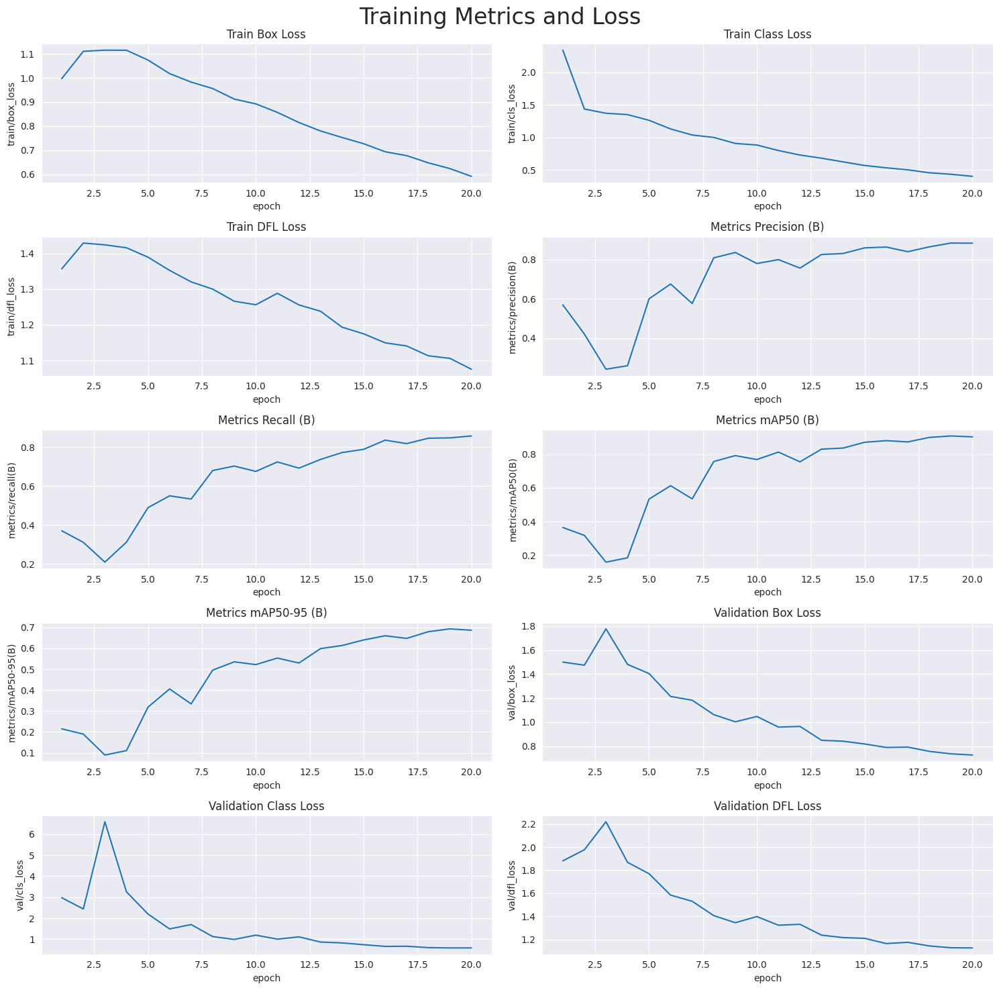

In [19]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('runs/detect/train2/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [20]:
%matplotlib inline
# Loading the best performing model
model = YOLO('runs/detect/train2/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/FIX-Waste-Detection-2/test/labels... 416 images, 0 backgrounds, 0 corrupt: 100%|██████████| 416/416 [00:00<00:00, 665.49it/s]

val: New cache created: /content/FIX-Waste-Detection-2/test/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 116, len(boxes) = 637. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]


                   all        416        637      0.913      0.857      0.926      0.779
         Botol_Plastik        120        127      0.875      0.874       0.94      0.849
                Kaleng        130        243      0.915      0.798      0.902      0.757
                Kardus        114        157       0.92       0.86      0.909      0.763
                Kertas         90        110      0.943      0.897      0.954      0.747
Speed: 0.5ms preprocess, 9.4ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/val


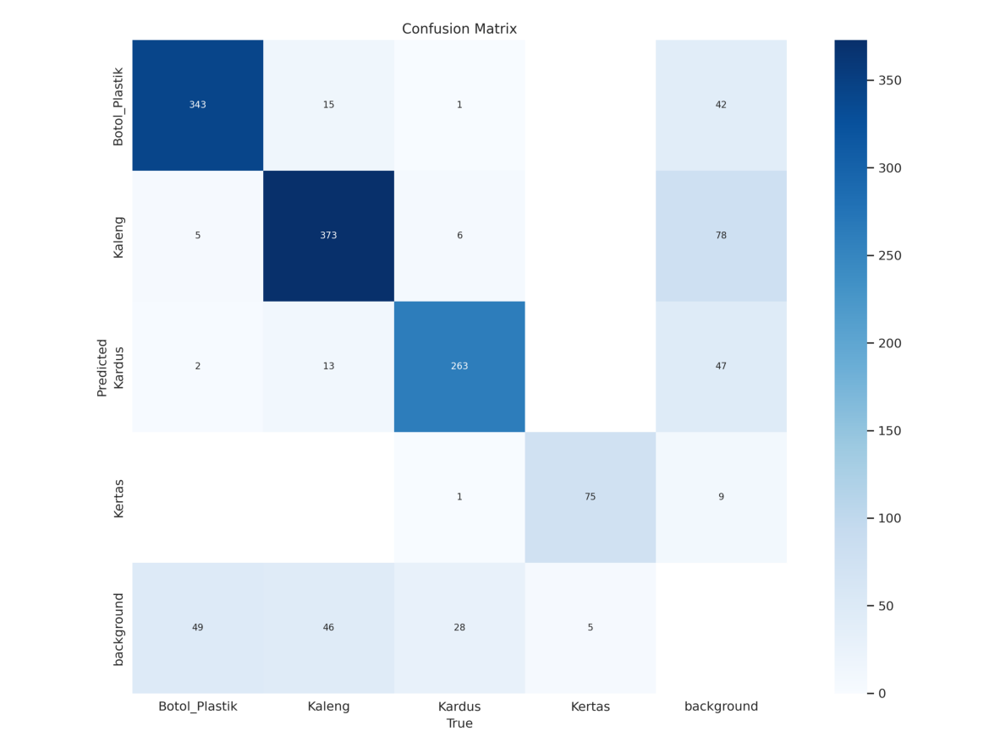

In [21]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('runs/detect/train2/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (15, 15))

ax.imshow(img)
ax.axis('off');

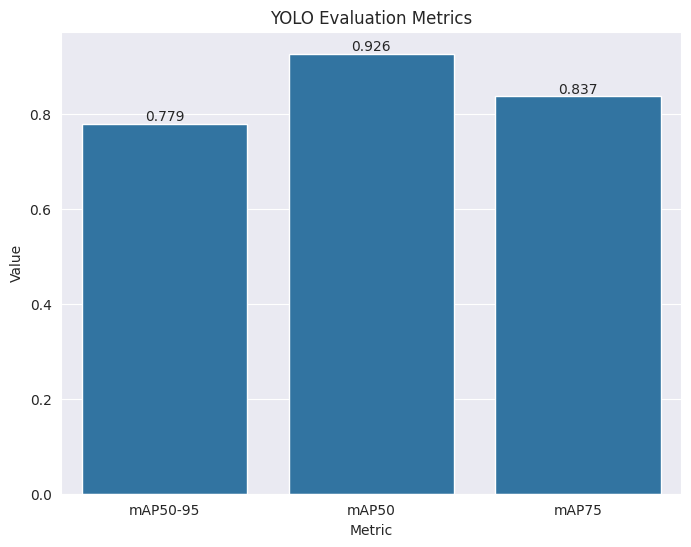

In [23]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

# Show the plot
plt.show()

In [24]:
# Function to perform ship detections
def ship_detect(img_path):

    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()

    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img


0: 640x640 1 Kaleng, 16.2ms
Speed: 2.3ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 16.2ms
Speed: 3.3ms preprocess, 16.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 Kalengs, 6 Karduss, 16.2ms
Speed: 3.8ms preprocess, 16.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 16.2ms
Speed: 3.2ms preprocess, 16.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 16.2ms
Speed: 1.6ms preprocess, 16.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 13.9ms
Speed: 2.0ms preprocess, 13.9ms inference, 1.3ms postprocess per image

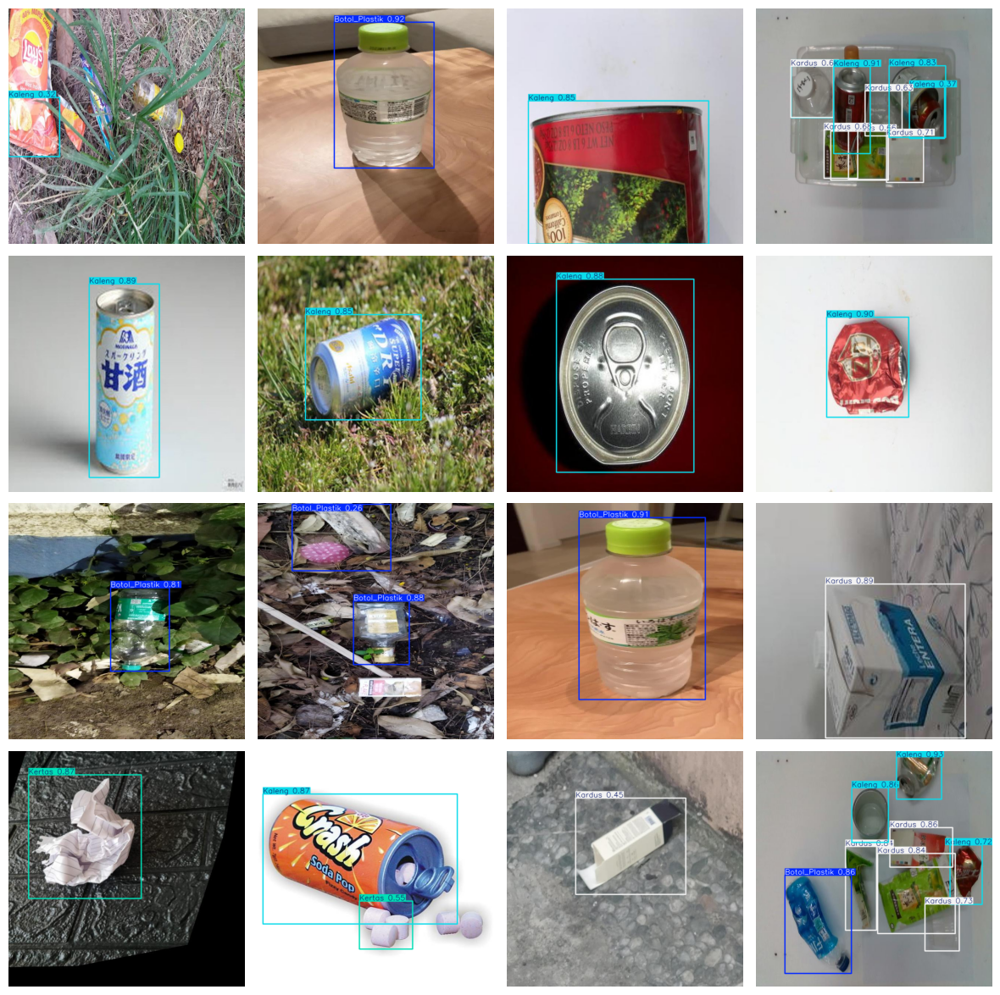

In [27]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/content/FIX-Waste-Detection-2/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)


0: 640x640 1 Kertas, 16.5ms
Speed: 2.3ms preprocess, 16.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 1 Kertas, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kardus, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Botol_Plastiks, 1 Kaleng, 16.2ms
Speed: 2.0ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 1 Kaleng, 16.2ms
Speed: 2.1ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Botol_Plastiks, 1 Kardus, 16.5ms
Speed: 2.2ms preprocess, 16.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 16.2ms
Speed: 2.3ms

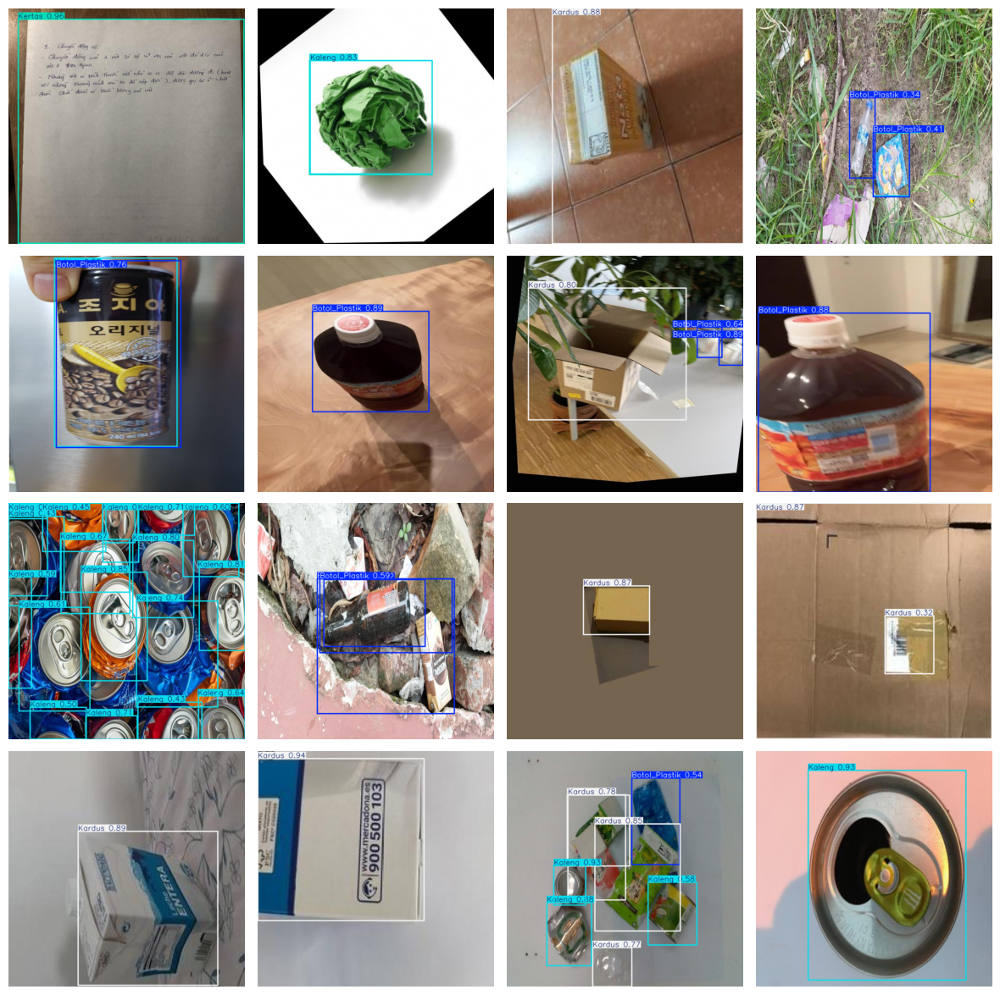

In [28]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/content/FIX-Waste-Detection-2/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)


0: 640x640 1 Botol_Plastik, 34.8ms
Speed: 2.9ms preprocess, 34.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 24.6ms
Speed: 2.2ms preprocess, 24.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kertas, 25.2ms
Speed: 2.0ms preprocess, 25.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 21.7ms
Speed: 2.0ms preprocess, 21.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kardus, 16.3ms
Speed: 8.1ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kardus, 16.3ms
Speed: 2.4ms preprocess, 16.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 16.2ms
Speed: 3.0ms preprocess, 16.2ms inference, 1.2ms postprocess per image at shape (1

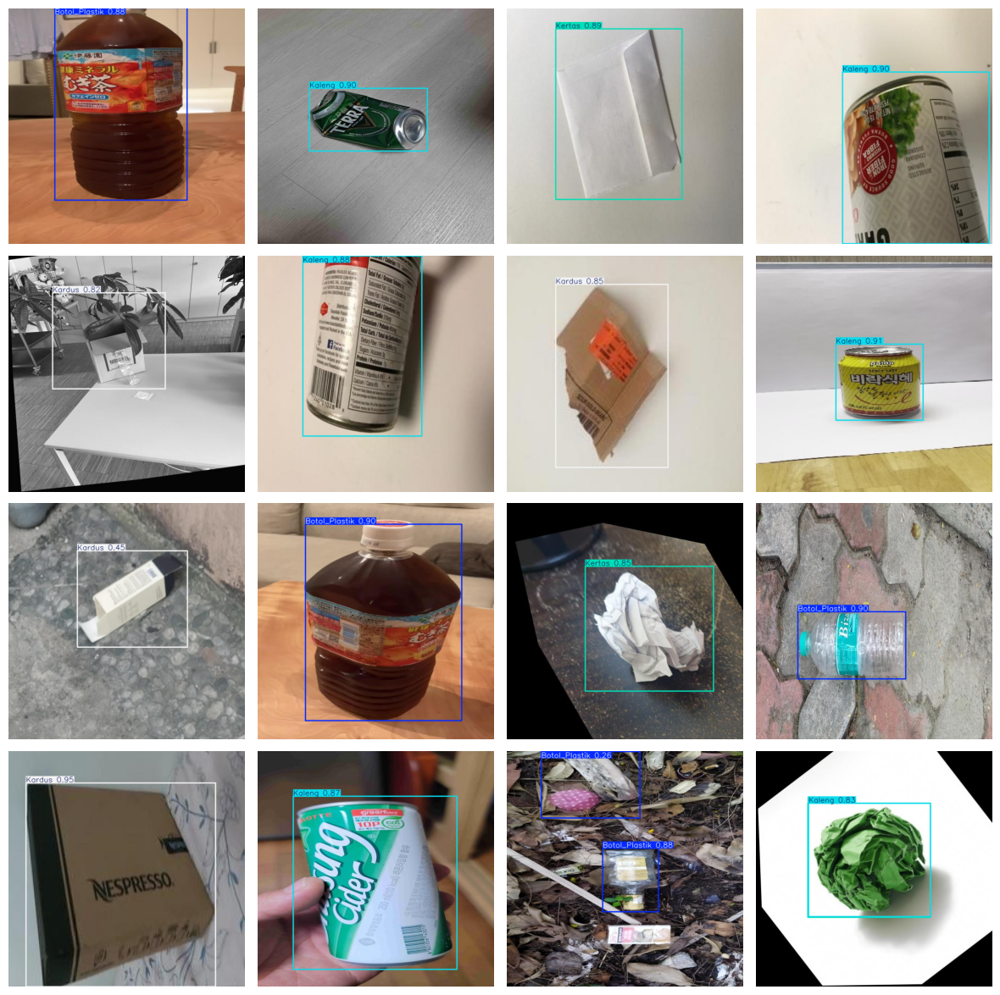

In [29]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/content/FIX-Waste-Detection-2/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)


0: 640x640 1 Kertas, 16.4ms
Speed: 2.1ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 16.2ms
Speed: 2.2ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 16.2ms
Speed: 2.2ms preprocess, 16.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 16.3ms
Speed: 1.5ms preprocess, 16.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Botol_Plastik, 16.2ms
Speed: 2.8ms preprocess, 16.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kardus, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Kaleng, 13.4ms
Speed: 2.0ms preprocess, 13.4ms inference, 1.2ms postprocess 

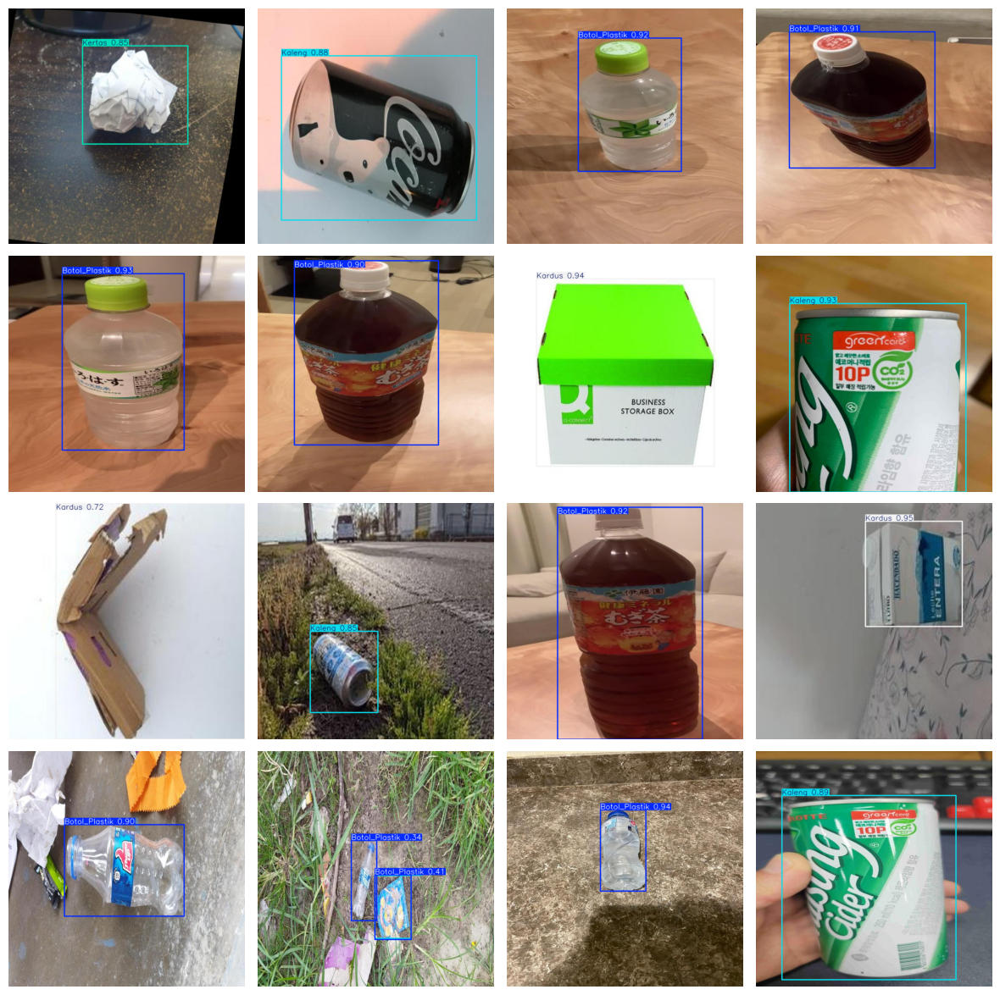

In [31]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/content/FIX-Waste-Detection-2/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)